In [1]:
import torchvision
import torch
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import random_split
from torch.utils.data import DataLoader
import os
import random
from pathlib import Path
import numpy as np
from PIL import Image
import shutil
from typing import Union, Dict, List, Tuple
import albumentations as A
import cv2
import matplotlib.pyplot as plt
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import warnings
import copy


#from google.colab import drive
#drive.mount('/content/drive')

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
print(torch.cuda.get_device_name(0))

cuda
NVIDIA GeForce RTX 4070 Laptop GPU


In [3]:
torch.cuda.empty_cache()
print(torch.cuda.memory_summary())

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |      0 B   |      0 B   |      0 B   |      0 B   |
|       from large pool |      0 B   |      0 B   |      0 B   |      0 B   |
|       from small pool |      0 B   |      0 B   |      0 B   |      0 B   |
|---------------------------------------------------------------------------|
| Active memory         |      0 B   |      0 B   |      0 B   |      0 B   |
|       from large pool |      0 B   |      0 B   |      0 B   |

In [4]:
class BalancedDatasetGenerator:
    def __init__(
        self,
        input_dir: str,
        output_dir: str = None,
        target_size: Tuple[int, int] = (224, 224),
        seed: int = 42
    ):
        """
        Initialize the balanced dataset generator.
        
        Args:
            input_dir: Path to input directory containing phenotype subfolders
            output_dir: Path to output directory (if None, will create 'balanced_dataset')
            target_size: Target size for the images (width, height)
            seed: Random seed for reproducibility
        """
        self.input_dir = Path(input_dir)
        self.output_dir = Path(output_dir) if output_dir else Path('balanced_dataset')
        self.target_size = target_size
        random.seed(seed)
        np.random.seed(seed)
        
        # Create augmentation pipeline
        self.augmentation = A.Compose([
            A.RandomRotate90(p=0.5),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.ShiftScaleRotate(p=0.5, shift_limit=0.0625, scale_limit=0.1, rotate_limit=45),
            A.OneOf([
                A.ElasticTransform(alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03, p=0.5),
                A.GridDistortion(p=0.5),
                A.OpticalDistortion(distort_limit=1, shift_limit=0.5, p=0.5),
            ], p=0.3),
            A.OneOf([
                A.GaussNoise(p=0.5),
                A.RandomBrightnessContrast(p=0.5),
                A.HueSaturationValue(p=0.5),
            ], p=0.3),
        ])

    def _load_image(self, image_path: str) -> np.ndarray:
        """Load and preprocess image."""
        image = cv2.imread(str(image_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

    def _save_image(self, image: np.ndarray, save_path: str):
        """Save the processed image."""
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        cv2.imwrite(str(save_path), image)

    def _augment_image(self, image: np.ndarray) -> np.ndarray:
        """Apply augmentation to image."""
        augmented = self.augmentation(image=image)
        return augmented['image']

    def analyze_dataset(self) -> Dict[str, int]:
        """
        Analyze the dataset and return count of images per phenotype.
        """
        phenotype_counts = {}
        for phenotype_dir in self.input_dir.iterdir():
            if phenotype_dir.is_dir():
                count = len(list(phenotype_dir.glob('*.jpg'))) + \
                        len(list(phenotype_dir.glob('*.png'))) + \
                        len(list(phenotype_dir.glob('*.jpeg')))
                phenotype_counts[phenotype_dir.name] = count
        return phenotype_counts

    def balance_dataset(self, strategy: str = 'match_max'):
        """
        Balance the dataset using the specified strategy.
        
        Args:
            strategy: Either 'match_max' to match the largest class or
                     'custom_size' to set a specific target size
        """
        # Create output directory
        self.output_dir.mkdir(parents=True, exist_ok=True)
        
        # Analyze current dataset
        phenotype_counts = self.analyze_dataset()
        max_count = max(phenotype_counts.values())
        
        # Process each phenotype
        for phenotype, current_count in phenotype_counts.items():
            print(f"Processing phenotype: {phenotype}")
            
            # Create output subdirectory
            phenotype_output_dir = self.output_dir / phenotype
            phenotype_output_dir.mkdir(parents=True, exist_ok=True)
            
            # Get list of source images
            source_images = list(self.input_dir.glob(f"{phenotype}/*.jpg")) + \
                          list(self.input_dir.glob(f"{phenotype}/*.png")) + \
                          list(self.input_dir.glob(f"{phenotype}/*.jpeg"))
            
            # Copy original images
            for idx, img_path in enumerate(source_images):
                image = self._load_image(str(img_path))
                save_path = phenotype_output_dir / f"original_{idx}{img_path.suffix}"
                self._save_image(image, str(save_path))
            
            # Calculate how many more images we need
            needed = max_count - current_count
            
            # Generate additional images through augmentation
            if needed > 0:
                print(f"Generating {needed} additional images for {phenotype}")
                for i in range(needed):
                    # Randomly select a source image
                    source_image_path = random.choice(source_images)
                    
                    # Load and augment image
                    image = self._load_image(str(source_image_path))
                    augmented_image = self._augment_image(image)
                    
                    # Save augmented image
                    save_path = phenotype_output_dir / f"augmented_{i}{source_image_path.suffix}"
                    self._save_image(augmented_image, str(save_path))
            
            print(f"Completed processing {phenotype}")

    def get_dataset_stats(self) -> Dict[str, Dict[str, int]]:
        """
        Get statistics about both original and balanced datasets.
        """
        original_stats = self.analyze_dataset()
        
        balanced_stats = {}
        if self.output_dir.exists():
            for phenotype_dir in self.output_dir.iterdir():
                if phenotype_dir.is_dir():
                    count = len(list(phenotype_dir.glob('*.jpg'))) + \
                            len(list(phenotype_dir.glob('*.png'))) + \
                            len(list(phenotype_dir.glob('*.jpeg')))
                    balanced_stats[phenotype_dir.name] = count
        
        return {
            'original': original_stats,
            'balanced': balanced_stats
        }

def split_data_into_sets(
    train_dir: Union[str, Path],
    val_dir: Union[str, Path],
    test_dir: Union[str, Path],
    val_split: float = 0.15,
    test_split: float = 0.15,
    seed: int = 42
) -> Dict:
    """
    Move a percentage of random images from train to validation and test directories for each phenotype.
    
    Args:
        train_dir: Path to training directory containing phenotype subfolders
        val_dir: Path to validation directory
        test_dir: Path to test directory
        val_split: Fraction of images for validation (default: 0.15 for 15%)
        test_split: Fraction of images for testing (default: 0.15 for 15%)
        seed: Random seed for reproducibility
    
    Returns:
        dict: Statistics about the split for each phenotype
    """
    if val_split + test_split >= 1.0:
        raise ValueError("Val_split + test_split must be less than 1.0")
    
    random.seed(seed)
    train_dir = Path(train_dir)
    val_dir = Path(val_dir)
    test_dir = Path(test_dir)
    
    # Dictionary to store statistics
    stats = {}
    
    # Supported image extensions
    img_extensions = ('.jpg', '.jpeg', '.png')
    
    # Process each phenotype subfolder
    for phenotype_dir in train_dir.iterdir():
        if not phenotype_dir.is_dir():
            continue
            
        phenotype = phenotype_dir.name
        val_phenotype_dir = val_dir / phenotype
        test_phenotype_dir = test_dir / phenotype
        
        # Ensure val and test phenotype directories exist
        val_phenotype_dir.mkdir(parents=True, exist_ok=True)
        test_phenotype_dir.mkdir(parents=True, exist_ok=True)
        
        # Get all image files
        images = [
            f for f in phenotype_dir.iterdir()
            if f.suffix.lower() in img_extensions
        ]
        
        total_images = len(images)
        
        # Calculate number of images for each set
        num_val = int(total_images * val_split)
        num_test = int(total_images * test_split)
        
        # Randomly shuffle images
        random.shuffle(images)
        
        # Split images into sets
        val_images = images[:num_val]
        test_images = images[num_val:num_val + num_test]
        # Remaining images stay in train
        
        # Move validation images
        for img_path in val_images:
            shutil.move(str(img_path), str(val_phenotype_dir / img_path.name))
            
        # Move test images
        for img_path in test_images:
            shutil.move(str(img_path), str(test_phenotype_dir / img_path.name))
        
        # Store statistics
        stats[phenotype] = {
            'total_images': total_images,
            'train_images': total_images - num_val - num_test,
            'val_images': num_val,
            'test_images': num_test
        }
        
        print(f"Processed {phenotype}:")
        print(f"  - Total images: {total_images}")
        print(f"  - Training images: {total_images - num_val - num_test}")
        print(f"  - Validation images: {num_val}")
        print(f"  - Test images: {num_test}\n")
    
    return stats

In [43]:
# 1. splitting the data into train/val/test
for fruit in os.listdir("data"):
    split_stats = split_data_into_sets(
    train_dir=f"data/{fruit}/train",
    val_dir=f"data/{fruit}/val",
    test_dir=f"data/{fruit}/test",
    val_split=0.15,
    test_split=0.15
    )

Processed Apple___alternaria_leaf_spot:
  - Total images: 278
  - Training images: 196
  - Validation images: 41
  - Test images: 41

Processed Apple___black_rot:
  - Total images: 621
  - Training images: 435
  - Validation images: 93
  - Test images: 93

Processed Apple___brown_spot:
  - Total images: 215
  - Training images: 151
  - Validation images: 32
  - Test images: 32

Processed Apple___gray_spot:
  - Total images: 395
  - Training images: 277
  - Validation images: 59
  - Test images: 59

Processed Apple___healthy:
  - Total images: 2570
  - Training images: 1800
  - Validation images: 385
  - Test images: 385

Processed Apple___rust:
  - Total images: 1241
  - Training images: 869
  - Validation images: 186
  - Test images: 186

Processed Apple___scab:
  - Total images: 1222
  - Training images: 856
  - Validation images: 183
  - Test images: 183

Processed Bell_pepper___bacterial_spot:
  - Total images: 997
  - Training images: 699
  - Validation images: 149
  - Test images

In [46]:
for fruit in os.listdir("data"):
        # 2. balancing only the training data
    generator = BalancedDatasetGenerator(
    input_dir=f"data/{fruit}/train",  # Only balance training data
    output_dir=f"data/{fruit}/balanced_train",
    target_size = (224,224)
    )
    # what our current dataset looks like
    print("Analyzing original dataset...")
    original_counts = generator.analyze_dataset()
    print("\nOriginal dataset statistics:")
    for phenotype, count in original_counts.items():
        print(f"{phenotype}: {count} images")

c:\Users\LEGION\AppData\Local\Programs\Python\Python310\lib\site-packages\albumentations\core\validation.py:58: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
C:\Users\LEGION\AppData\Local\Temp\ipykernel_32460\3251984087.py:31: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03, p=0.5),
C:\Users\LEGION\AppData\Local\Temp\ipykernel_32460\3251984087.py:33: UserWarning: Argument(s) 'shift_limit' are not valid for transform OpticalDistortion
  A.OpticalDistortion(distort_limit=1, shift_limit=0.5, p=0.5),


Analyzing original dataset...

Original dataset statistics:
Apple___alternaria_leaf_spot: 196 images
Apple___black_rot: 435 images
Apple___brown_spot: 151 images
Apple___gray_spot: 277 images
Apple___healthy: 1800 images
Apple___rust: 869 images
Apple___scab: 856 images
Analyzing original dataset...

Original dataset statistics:
Bell_pepper___bacterial_spot: 699 images
Bell_pepper___healthy: 1036 images
Analyzing original dataset...

Original dataset statistics:
Cassava___bacterial_blight: 761 images
Cassava___brown_streak_disease: 1533 images
Cassava___green_mottle: 1672 images
Cassava___healthy: 1805 images
Cassava___mosaic_disease: 9212 images
Analyzing original dataset...

Original dataset statistics:
Cherry___healthy: 598 images
Cherry___powdery_mildew: 738 images
Analyzing original dataset...

Original dataset statistics:
Coffee___healthy: 555 images
Coffee___red_spider_mite: 117 images
Coffee___rust: 422 images
Analyzing original dataset...

Original dataset statistics:
Corn___c

In [47]:
for fruit in os.listdir("data"):
    # 2. balancing only the training data
    generator = BalancedDatasetGenerator(
    input_dir=f"data/{fruit}/train",  # Only balance training data
    output_dir=f"data/{fruit}/balanced_train",
    target_size = (224,224)
    )

    # balancing the dataset
    print("\nBalancing dataset...")
    generator.balance_dataset()


    # Checking the final statistics
    stats = generator.get_dataset_stats()
    print("\nFinal dataset statistics:")
    for phenotype, count in stats['balanced'].items():
        print(f"{phenotype}: {count} images")

C:\Users\LEGION\AppData\Local\Temp\ipykernel_32460\3251984087.py:31: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03, p=0.5),
C:\Users\LEGION\AppData\Local\Temp\ipykernel_32460\3251984087.py:33: UserWarning: Argument(s) 'shift_limit' are not valid for transform OpticalDistortion
  A.OpticalDistortion(distort_limit=1, shift_limit=0.5, p=0.5),



Balancing dataset...
Processing phenotype: Apple___alternaria_leaf_spot
Generating 1604 additional images for Apple___alternaria_leaf_spot
Completed processing Apple___alternaria_leaf_spot
Processing phenotype: Apple___black_rot
Generating 1365 additional images for Apple___black_rot
Completed processing Apple___black_rot
Processing phenotype: Apple___brown_spot
Generating 1649 additional images for Apple___brown_spot
Completed processing Apple___brown_spot
Processing phenotype: Apple___gray_spot
Generating 1523 additional images for Apple___gray_spot
Completed processing Apple___gray_spot
Processing phenotype: Apple___healthy
Completed processing Apple___healthy
Processing phenotype: Apple___rust
Generating 931 additional images for Apple___rust
Completed processing Apple___rust
Processing phenotype: Apple___scab
Generating 944 additional images for Apple___scab
Completed processing Apple___scab

Final dataset statistics:
Apple___alternaria_leaf_spot: 1800 images
Apple___black_rot: 1

In [5]:
def get_mean_and_std(loader):
    mean = 0
    std = 0
    total_images_count = 0
    for images,_ in loader:
        image_count_in_a_batch = images.size(0)
        images = images.view(image_count_in_a_batch, images.size(1), -1)
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)
        total_images_count += image_count_in_a_batch
    mean /= total_images_count
    std /= total_images_count
    return mean, std


def show_transformed_images(dataset):
    loader = DataLoader(dataset, batch_size=6, shuffle=True)
    batch = next(iter(loader))
    images, labels = batch

    grid = torchvision.utils.make_grid(images, nrow=3)
    plt.figure(figsize=(11,11))
    plt.imshow(np.transpose(grid, (1,2,0)))
    print("labels:", labels)

#The Custom Model
class cnnnet(nn.Module):
  def __init__(self):
    super().__init__()

    self.conv1  = nn.Conv2d(3,128,3,padding=1)
    # output size: (224+2*1-3)/1 + 1 = 224/2 = 112 (/2 b/c maxpool)
    self.bnorm1 = nn.BatchNorm2d(128)

    # second convolution layer
    self.conv2  = nn.Conv2d(128,136,3,padding=1)
    # output size: (112+2*1-3)/1 + 1 = 112/2 = 56  (/2 b/c maxpool)
    self.bnorm2 = nn.BatchNorm2d(136)

    # third convolution layer
    self.conv3  = nn.Conv2d(136,144,3,padding=1)
    # output size: (56+2*1-3)/1 + 1 = 56/2 = 28 (/2 b/c maxpool)
    self.bnorm3 = nn.BatchNorm2d(144)

    # fourth convolution layer
    self.conv4  = nn.Conv2d(144,152,3,padding=1)
    # output size: (28+2*1-3)/1 + 1 = 144/2 = 14 (/2 b/c maxpool)
    self.bnorm4 = nn.BatchNorm2d(152)

    # fifth convolution layer
    self.conv5= nn.Conv2d(152,256,3,padding=1)
    # output size: (14+2*1-3)/1 + 1 = 14/2 = 7 (/2 b/c maxpool)
    self.bnorm5 = nn.BatchNorm2d(256)

    # sixth convolution layer
    self.conv6= nn.Conv2d(256,256,3,padding=1)
    # output size: (7+2*1-3)/1 + 1 = 8/2 = 3 (/2 b/c maxpool)
    self.bnorm6 = nn.BatchNorm2d(256)


    ### -------------- linear decision layers -------------- ###
    self.fc1 = nn.Linear(3*3*256,128)
    self.fc2 = nn.Linear(128,64)
    self.fc3 = nn.Linear(64,32)
    self.fc4 = nn.Linear(32,10)

  def forward(self,x):

    # first block: convolution -> maxpool -> batchnorm -> relu
    x = F.max_pool2d(self.conv1(x),2)
    x = F.relu(self.bnorm1(x))

    # second block: convolution -> maxpool -> batchnorm -> relu
    x = F.max_pool2d(self.conv2(x),2)
    x = F.relu(self.bnorm2(x))

    # third block: convolution -> maxpool -> batchnorm -> relu
    x = F.max_pool2d(self.conv3(x),2)
    x = F.relu(self.bnorm3(x))


    # Fourth block: convolution -> maxpool -> batchnorm -> relu
    x = F.max_pool2d(self.conv4(x),2)
    x = F.relu(self.bnorm4(x))


    # Fifth block: convolution -> maxpool -> batchnorm -> relu
    x = F.max_pool2d(self.conv5(x),2)
    x = F.relu(self.bnorm5(x))


    # Sifth block: convolution -> maxpool -> batchnorm -> relu
    x = F.max_pool2d(self.conv6(x),2)
    x = F.relu(self.bnorm6(x))

    # reshape for linear layer
    nUnits = x.shape.numel()/x.shape[0]
    x = x.view(-1,int(nUnits))

    # linear layers
    x = F.relu(self.fc1(x))
    x = F.dropout(x,p=.25,training=self.training)
    x = F.relu(self.fc2(x))
    x = F.dropout(x,p=.25,training=self.training)
    x = F.relu(self.fc3(x))
    x = F.dropout(x,p=.25,training=self.training)
    x = self.fc4(x)
    return x


In [6]:
def function2trainTheModel(net,optimizer,lossfun,numepochs):


  # send the model to the GPU
  net.to(device)

  # initialize losses
  trainLoss = torch.zeros(numepochs)
  valLoss   = torch.zeros(numepochs)
  trainAcc  = torch.zeros(numepochs)
  valAcc    = torch.zeros(numepochs)

  # loop over epochs
  for epochi in range(numepochs):

    # loop over training data batches
    net.train() # switch to train mode
    batchLoss = []
    batchAcc  = []
    for X,y in train_loader:
      X = X.to(device)
      y = y.to(device)

      # forward pass and loss
      yHat = net(X)
      loss = lossfun(yHat,y)

      # backprop
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      # loss and accuracy from this batch
      batchLoss.append(loss.item())
      batchAcc.append( torch.mean((torch.argmax(yHat,axis=1) == y).float()).item() )
    # end of batch loop...

    # and get average losses and accuracies across the batches
    trainLoss[epochi] = np.mean(batchLoss)
    trainAcc[epochi]  = 100*np.mean(batchAcc)


    #### test performance (here done in batches!)
    net.eval() # switch to test mode
    batchAcc  = []
    batchLoss = []
    for X,y in val_loader:
      X = X.to(device)
      y = y.to(device)

      # forward pass and loss
      with torch.no_grad():
        yHat = net(X)
        loss = lossfun(yHat,y)

      # loss and accuracy from this batch
      batchLoss.append(loss.item())
      batchAcc.append( torch.mean((torch.argmax(yHat,axis=1) == y).float()).item() )
    # end of batch loop...

    # and get average losses and accuracies across the batches
    valLoss[epochi] = np.mean(batchLoss)
    valAcc[epochi]  = 100*np.mean(batchAcc)

  # end epochs

  # function output
  return trainLoss,valLoss,trainAcc,valAcc,net

In [6]:
def data_preprocessing(fruit):

    train_data_path = f"data/{fruit}/balanced_train"
    val_data_path = f"data/{fruit}/val"
    test_data_path = f"data/{fruit}/test"

    num_classes = len(os.listdir(train_data_path))
    phenos = {i: item for i, item in enumerate(os.listdir(train_data_path))}
    print(f"# of Classes(Phenotypes): {num_classes}")
    print(f"Classes: {phenos}")
    print(" ")

    training_transforms = transforms.Compose([transforms.Resize((224,224)),transforms.ToTensor()])
    plant_data = torchvision.datasets.ImageFolder(root=train_data_path, transform=training_transforms)  
    plant_loader = torch.utils.data.DataLoader(plant_data, batch_size=32, shuffle=False)
    mean, std = get_mean_and_std(plant_loader)


    train_transforms = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.RandomHorizontalFlip(),  # Data augmentation for training
        transforms.RandomRotation(10),      # Data augmentation for training
        transforms.ToTensor(),
        transforms.Normalize(mean,std)
    ])

    val_transforms = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize(mean,std)
    ])


    train_dataset = torchvision.datasets.ImageFolder(root=train_data_path, transform=train_transforms)
    test_dataset = torchvision.datasets.ImageFolder(root=test_data_path, transform=val_transforms)
    val_dataset = torchvision.datasets.ImageFolder(root=val_data_path, transform=val_transforms)


    print(f"Train: {len(train_dataset)}")
    print(f"Valid: {len(val_dataset)}")
    print(f"Test: {len(test_dataset)}")


    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader  = DataLoader(val_dataset,batch_size=32, shuffle=True)
    test_loader  = DataLoader(test_dataset,batch_size=32, shuffle=True)

    return train_loader, val_loader, test_loader, phenos, num_classes

In [7]:
def plot_metrics(net, test_loader, device, lossfun, trainLoss, valLoss, trainAcc, valAcc, fruit):
    """Plots model metrics (loss and accuracy)"""
    net.eval()
    X, y = next(iter(test_loader))
    X, y = X.to(device), y.to(device)
    
    with torch.no_grad():
        predictions = net(X)
        loss = lossfun(predictions, y)
    
    testLoss = loss.item()
    testAcc = 100*torch.mean((torch.argmax(predictions,axis=1) == y).float()).item()
    
    fig, ax = plt.subplots(1, 2, figsize=(16, 5))
    fig.suptitle(f'Model Results for {fruit}', fontsize=16)
    
    ax[0].plot(trainLoss,'s-',label='Train')
    ax[0].plot(valLoss,'o-',label='Val')
    ax[0].plot(len(valLoss)-1,testLoss,'r*',markersize=15,label='Test')
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Loss (CEL)')
    ax[0].set_title(f'Final Model Train/Val/Test Loss: {trainLoss[-1]:.2f}/{valLoss[-1]:.2f}/{testLoss:.2f}')
    ax[0].legend()
    
    ax[1].plot(trainAcc,'s-',label='Train')
    ax[1].plot(valAcc,'o-',label='Val')
    ax[1].plot(len(valAcc)-1,testAcc,'r*',markersize=15,label='Test')
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Accuracy (%)')
    ax[1].set_title(f'Final Model Train/Val/Test Accuracy: {trainAcc[-1]:.2f}/{valAcc[-1]:.2f}/{testAcc:.2f}%')
    ax[1].legend()
    
    plt.tight_layout()
    return fig, testLoss, testAcc

In [8]:
def plot_predictions(net, test_loader, device, phenos):
    """Plots sample predictions with actual and predicted labels"""
    warnings.filterwarnings('ignore')
    
    net.eval()
    X, y = next(iter(test_loader))
    X, y = X.to(device), y.to(device)
    
    with torch.no_grad():
        predictions = net(X)
    
    fig, axs = plt.subplots(3,5, figsize=(15, 7))
    axs = axs.flatten()
    
    pics2use = np.random.choice(X.size(0), size=25, replace=False)
    X_subset = X[pics2use].cpu()
    predictions_subset = predictions[pics2use]
    labels_subset = y[pics2use]
    
    for i, ax in enumerate(axs):
        if i < len(X_subset):
            image = X_subset[i].permute(1, 2, 0)
            image = (image - image.min()) / (image.max() - image.min())
            act_label = phenos[int(labels_subset[i])]
            pred_label = phenos[int(torch.argmax(predictions_subset[i]))]
            ax.imshow(image.numpy())
            ax.text(0.5, -0.1, f'True: {act_label}',
                    fontsize=10, fontweight='bold', color='black',
                    horizontalalignment='center', transform=ax.transAxes)
            ax.text(0.5, 1.1, f'Pred: {pred_label}',
                    fontsize=10, fontweight='bold',
                    color='red' if pred_label != act_label else 'green',
                    horizontalalignment='center', transform=ax.transAxes)
        ax.axis('off')
    
    plt.tight_layout()
    warnings.filterwarnings('default')
    return fig

In [ ]:
#Pretrained models
weights = torchvision.models.EfficientNet_B4_Weights.DEFAULT
efB4 = torchvision.models.efficientnet_b4(weights=weights)

weights = torchvision.models.ResNet18_Weights.DEFAULT
resnet18 = torchvision.models.resnet18(weights=weights)

weights = torchvision.models.AlexNet_Weights.DEFAULT
alexnet = torchvision.models.alexnet(weights=weights)

weights = torchvision.models.VGG16_Weights.DEFAULT
vgg16 = torchvision.models.vgg16(weights=weights)

weights = torchvision.models.ResNet152_Weights.DEFAULT
resnet152 = torchvision.models.resnet152(weights=weights)

weights = torchvision.models.EfficientNet_B7_Weights.DEFAULT
efficientB7 = torchvision.models.efficientnet_b7(weights=weights)

weights = torchvision.models.DenseNet201_Weights.DEFAULT
dense201 = torchvision.models.densenet201(weights=weights)



In [ ]:
for p in efB4.parameters():
    p.requires_grad = False

efB4.classifier[-1] = nn.Linear(1792,num_classes)
efB4

In [9]:
from torchsummary import summary
net = cnnnet()
summary(net.to(device),(3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1        [-1, 128, 224, 224]           3,584
       BatchNorm2d-2        [-1, 128, 112, 112]             256
            Conv2d-3        [-1, 136, 112, 112]         156,808
       BatchNorm2d-4          [-1, 136, 56, 56]             272
            Conv2d-5          [-1, 144, 56, 56]         176,400
       BatchNorm2d-6          [-1, 144, 28, 28]             288
            Conv2d-7          [-1, 152, 28, 28]         197,144
       BatchNorm2d-8          [-1, 152, 14, 14]             304
            Conv2d-9          [-1, 256, 14, 14]         350,464
      BatchNorm2d-10            [-1, 256, 7, 7]             512
           Conv2d-11            [-1, 256, 7, 7]         590,080
      BatchNorm2d-12            [-1, 256, 3, 3]             512
           Linear-13                  [-1, 128]         295,040
           Linear-14                   

# of Classes(Phenotypes): 7
Classes: {0: 'Apple___alternaria_leaf_spot', 1: 'Apple___black_rot', 2: 'Apple___brown_spot', 3: 'Apple___gray_spot', 4: 'Apple___healthy', 5: 'Apple___rust', 6: 'Apple___scab'}
 
Train: 12600
Valid: 979
Test: 979


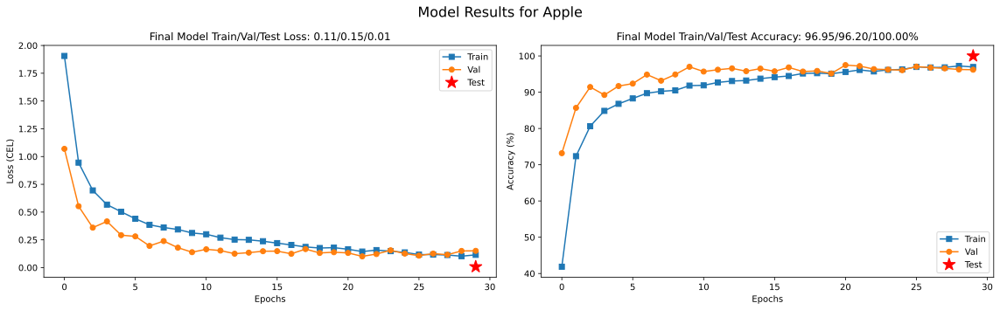

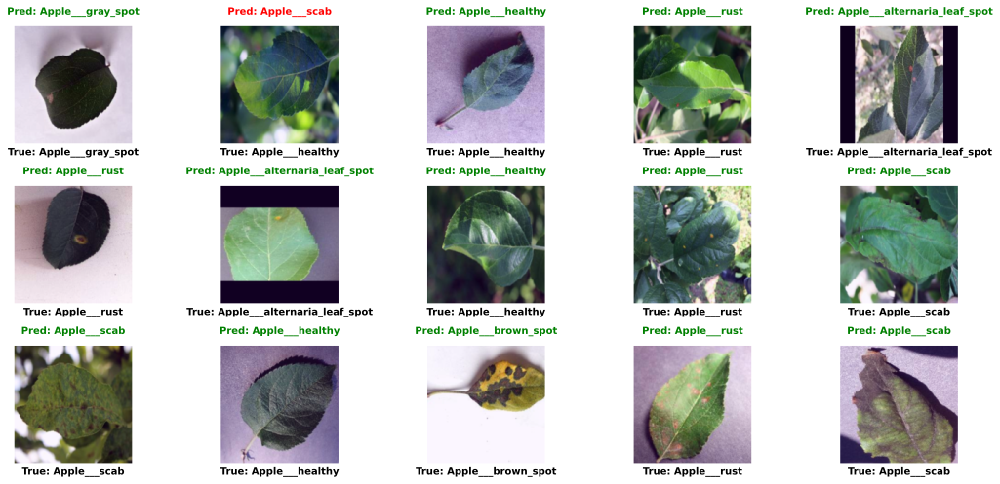

# of Classes(Phenotypes): 2
Classes: {0: 'Bell_pepper___bacterial_spot', 1: 'Bell_pepper___healthy'}
 
Train: 2072
Valid: 370
Test: 370


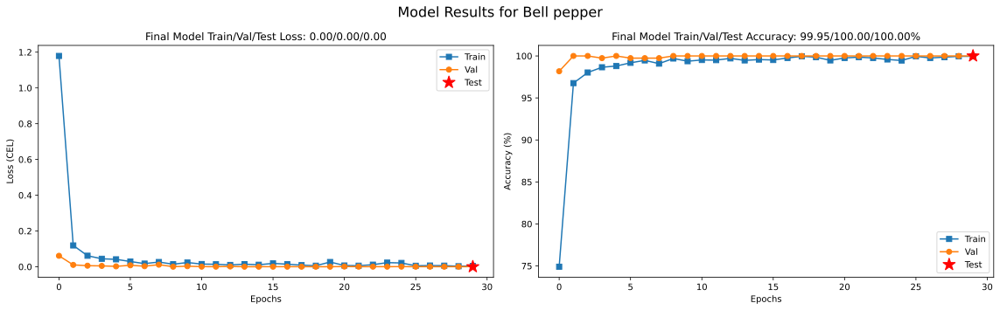

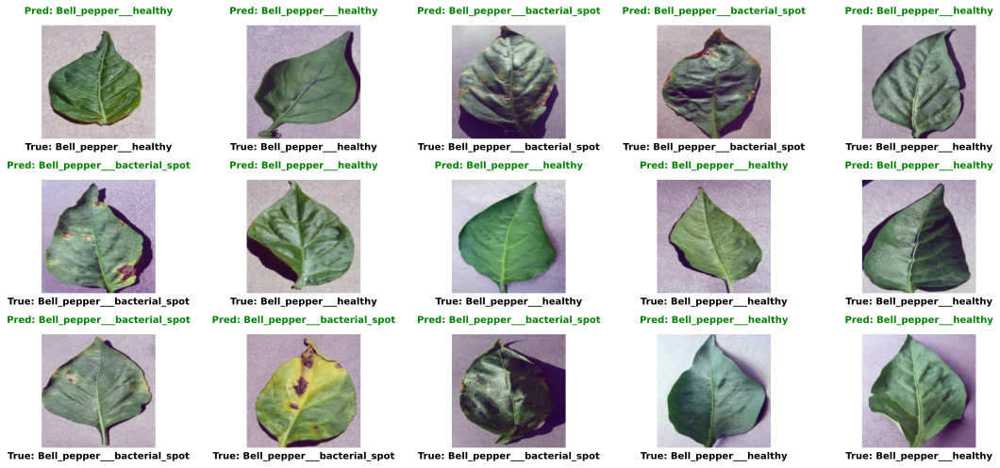

# of Classes(Phenotypes): 5
Classes: {0: 'Cassava___bacterial_blight', 1: 'Cassava___brown_streak_disease', 2: 'Cassava___green_mottle', 3: 'Cassava___healthy', 4: 'Cassava___mosaic_disease'}
 
Train: 46060
Valid: 3207
Test: 3207


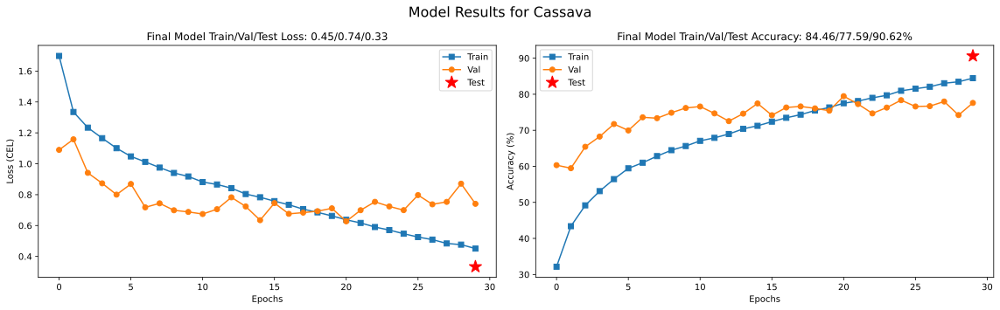

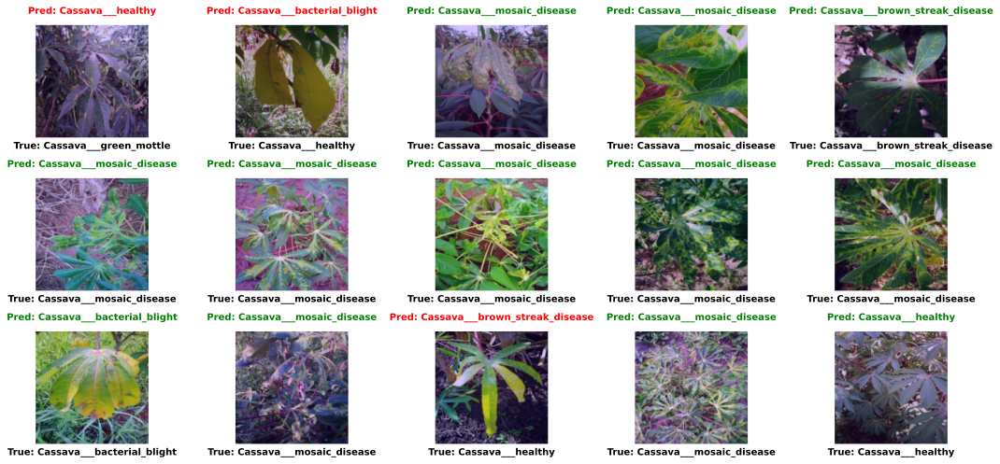

# of Classes(Phenotypes): 2
Classes: {0: 'Cherry___healthy', 1: 'Cherry___powdery_mildew'}
 
Train: 1476
Valid: 285
Test: 285


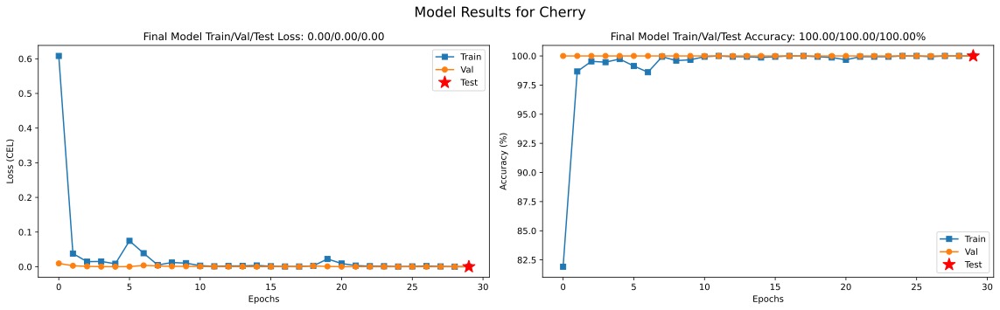

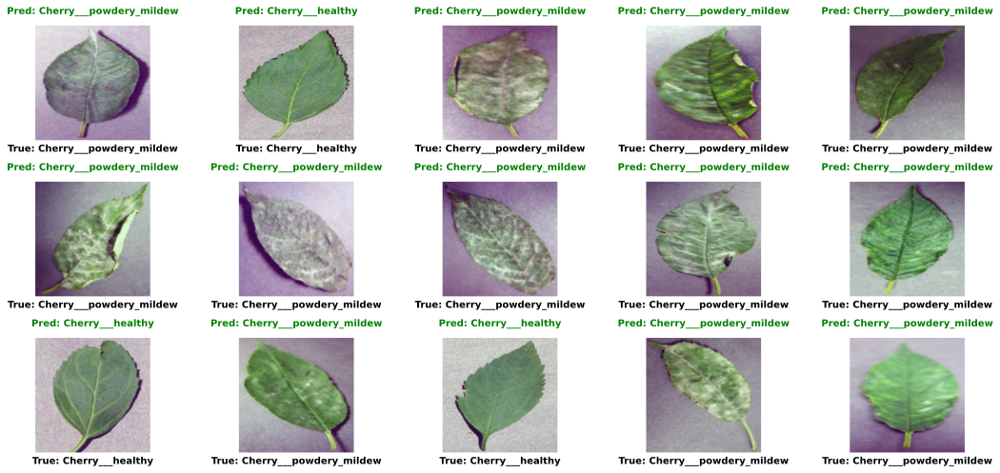

# of Classes(Phenotypes): 3
Classes: {0: 'Coffee___healthy', 1: 'Coffee___red_spider_mite', 2: 'Coffee___rust'}
 
Train: 1665
Valid: 233
Test: 233


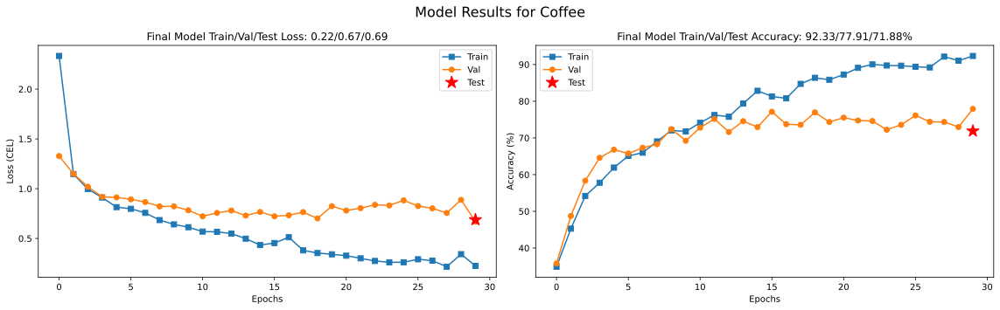

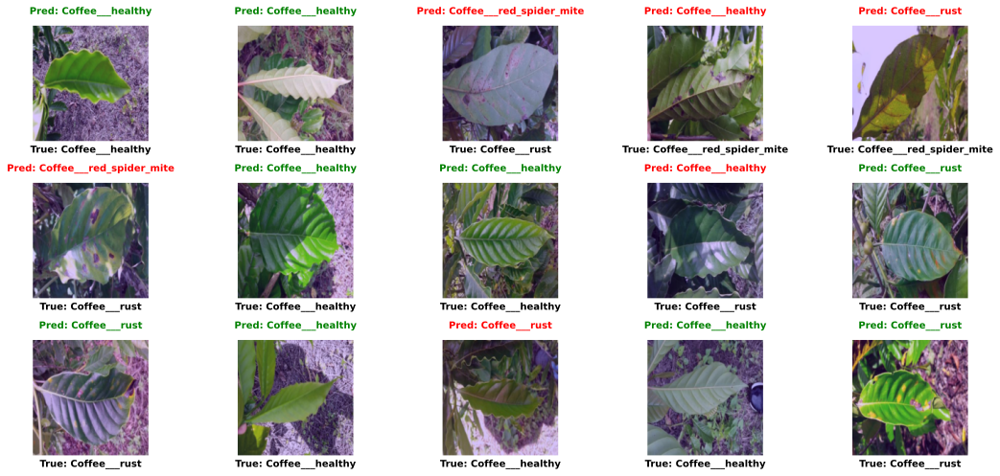

# of Classes(Phenotypes): 4
Classes: {0: 'Corn___common_rust', 1: 'Corn___gray_leaf_spot', 2: 'Corn___healthy', 3: 'Corn___northern_leaf_blight'}
 
Train: 3344
Valid: 575
Test: 575


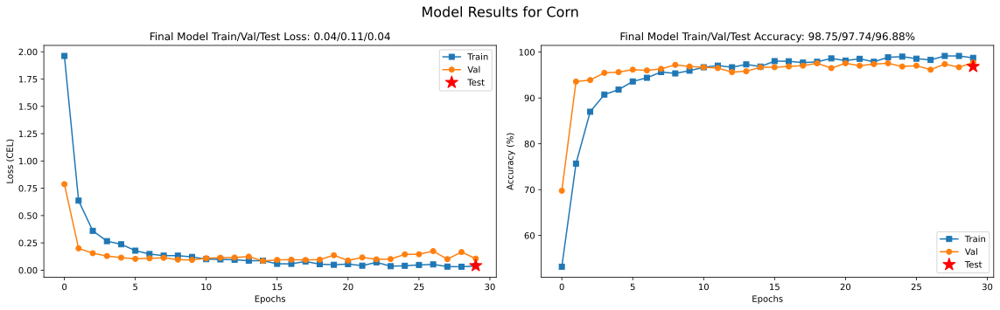

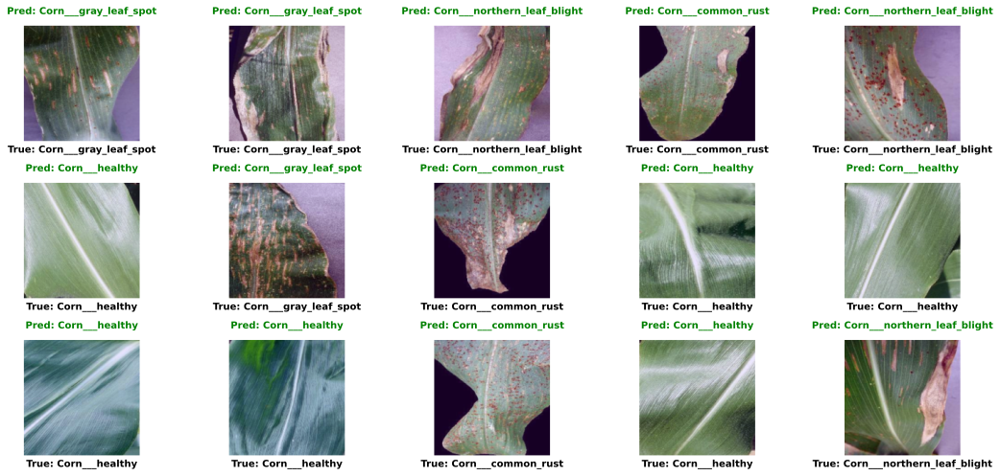

# of Classes(Phenotypes): 4
Classes: {0: 'Grape___black_measles', 1: 'Grape___black_rot', 2: 'Grape___healthy', 3: 'Grape___Leaf_blight'}
 
Train: 7484
Valid: 1113
Test: 1113


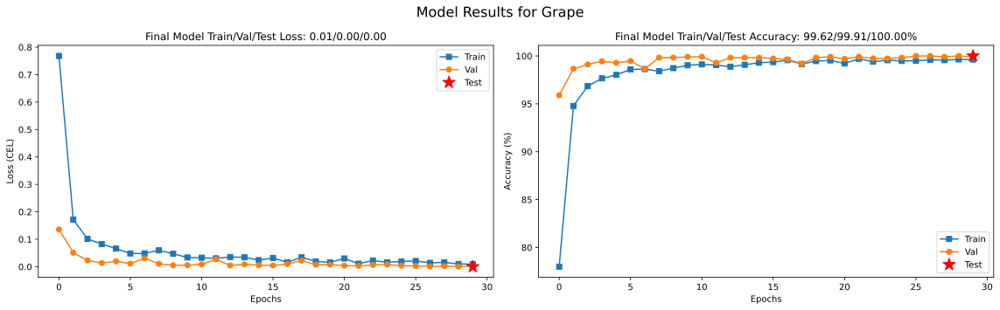

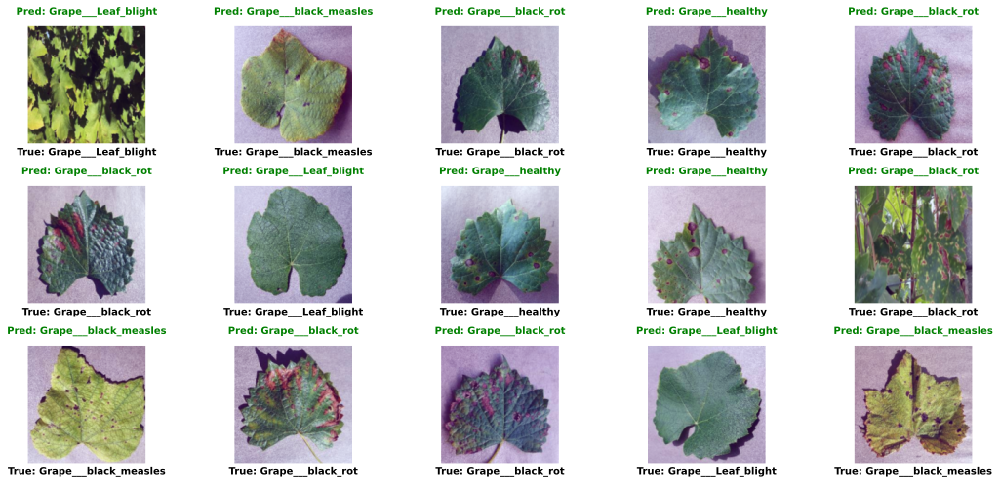

# of Classes(Phenotypes): 5
Classes: {0: 'Blueberry___healthy', 1: 'Orange___citrus_greening', 2: 'Raspberry___healthy', 3: 'Soybean___healthy', 4: 'Squash___powdery_mildew'}
 
Train: 19275
Valid: 2144
Test: 2144


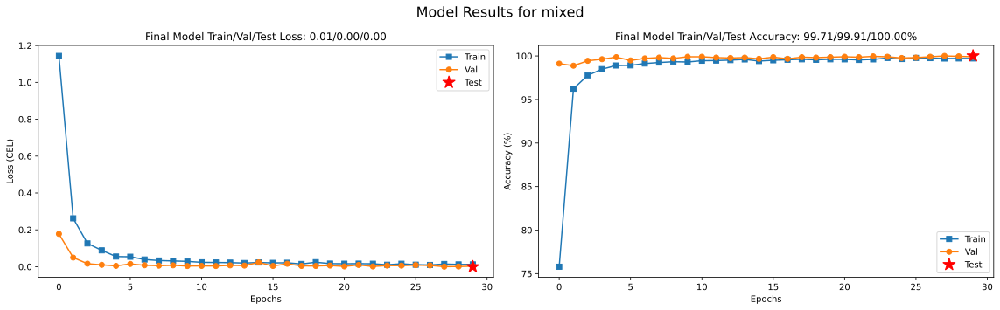

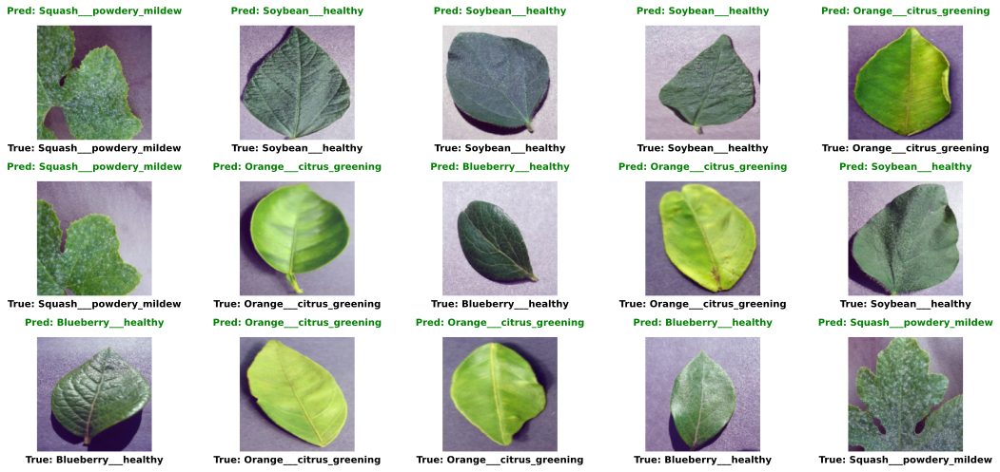

# of Classes(Phenotypes): 2
Classes: {0: 'Peach___bacterial_spot', 1: 'Peach___healthy'}
 
Train: 3218
Valid: 398
Test: 398


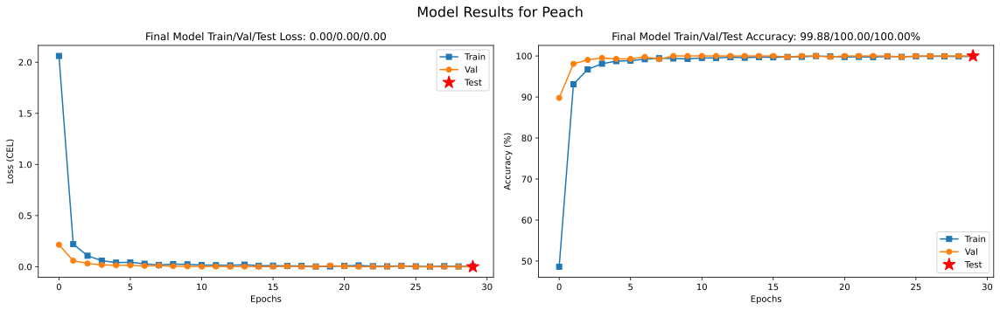

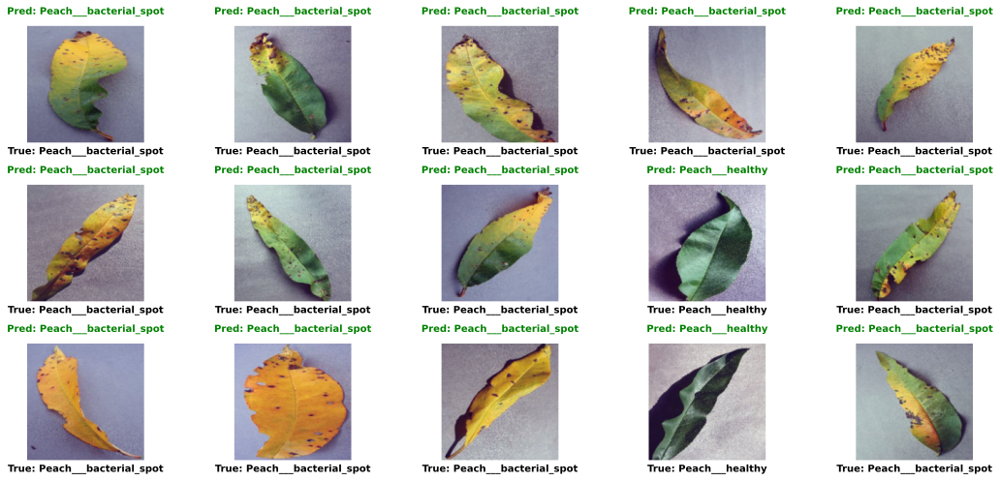

# of Classes(Phenotypes): 10
Classes: {0: 'Potato___bacterial_wilt', 1: 'Potato___early_blight', 2: 'Potato___healthy', 3: 'Potato___late_blight', 4: 'Potato___leafroll_virus', 5: 'Potato___mosaic_virus', 6: 'Potato___nematode', 7: 'Potato___pests', 8: 'Potato___phytophthora', 9: 'Potato___spindle_tuber_viroid'}
 
Train: 18400
Valid: 1476
Test: 1476


KeyboardInterrupt: 

In [9]:
PATH = "models/cnnet_v2.pth"
for fruit in os.listdir("data"):
    train_loader, val_loader, test_loader, phenos, num_classes = data_preprocessing(fruit)
    net = cnnnet()
    net = torch.load(PATH, weights_only=False)
    lossfun = nn.CrossEntropyLoss()
    optimizer = optim.Adam(net.parameters(), lr=0.001)
    trainLoss,valLoss,trainAcc,valAcc,net = function2trainTheModel(net,optimizer,lossfun,numepochs=30)
    metrics_fig, testLoss, testAcc = plot_metrics(net, test_loader, device, lossfun, trainLoss, valLoss, trainAcc, valAcc, fruit)
    pred_fig = plot_predictions(net, test_loader, device, phenos)
    plt.show()
    PATH = "models/cnnet_v2.pth"
    torch.save(net.cpu(),PATH)

In [ ]:
test_data_path = f"data/{fruit}/test"


net = cnnnet()
net = torch.load(PATH, weights_only=False)

net.eval() # switch to test mode
X,y = next(iter(test_loader))

net.to(device)

# forward pass and loss
with torch.no_grad():
  predictions = net(X)
  loss = lossfun(predictions,y)

# loss and accuracy from this batch
testLoss = loss.item()
testAcc  = 100*torch.mean((torch.argmax(predictions,axis=1) == y).float()).item()

print(testLoss)
print(testAcc)